# Auxiliary tutorial 4: Lasso and ridge regression
*This tutorial was generated from an Jupyter notebook.  You can download the notebook [here](r4_lasso_ridge.ipynb).*


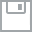
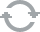
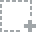
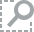
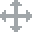
...
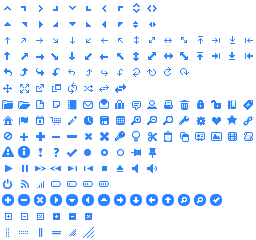
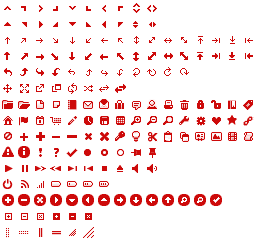
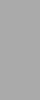
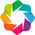
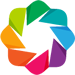

In [9]:
import glob
import re
import warnings

# The workhorses
import numpy as np
import pandas as pd

# scikit-learn stuff
import sklearn
import sklearn.cross_validation
import sklearn.linear_model

# Plotting modules
import matplotlib.pyplot as plt

# BE/Bi 103 utilities
import bebi103

# Import Bokeh modules for interactive plotting
import bokeh.io
import bokeh.models
import bokeh.plotting

# Display graphics in this notebook
bokeh.io.output_notebook()

# This is to enable inline displays for the purposes of the tutorial
%matplotlib inline

# This enables SVG graphics inline
%config InlineBackend.figure_formats = {'png', 'retina'}

# Seaborn makes plots look nice
import seaborn as sns
sns.set_context('notebook', font_scale=1.5, rc={'lines.linewidth': 2.5})
sns.set_style('darkgrid', {'axes.facecolor': '(0.875, 0.875, 0.9)'})

# Suppress future warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [10]:
pd.__version__

'0.17.0'

In this tutorial, we will investigate some techniques to use when we have far more parameters in our model than we do data.  In fact, we have so many that doing full Bayesian calculations, for example by MCMC, becomes computationally intractable.

Specifically, we will look at a linear model ("model 2") for our data.  We will use the techniques of LASSO and ridge regression to attempt to fit our data and learn something from it.

## The data set 
In [Homework 3](../hw_solutions/hw3_solution.html), we took a file with fMRI data for brain activity across 90,000+ grayordinates, grouped these activities by brain region, and then computed pairwise Pearson correlations across all brain types.  I did the same for 54 other patients.  I stored the upper triangle (excluding the diagonal) of all of these in CSV files.  You can download these files [here](../data/brain_correlation.zip).

Let's start be loading these matrices and putting them together in a single `DataFrame`.  For convenience, we will label the indices in the matrix `i` and `j`, with each `i`,`j` pair having a unique label `k`.  The values of `i` and `j` correspond to specific regions in the brain, and this is stored in the `regionkey.csv` file included with the data set.  We can load those values for reference.

In [12]:
df_key = pd.read_csv('../data/dubois_et_al/brain_correlation/regionkey.csv',
                    header=None, names=['region'])

Now, we'll load in the data and construct our master `DataFrame`.

In [13]:
# Set up DataFrame
df = pd.DataFrame(columns=['subject', 'i', 'j', 'k', 'corr'])

# Get list of data files
data_files = glob.glob('../data/dubois_et_al/brain_correlation/*_corr.csv')

# Load files into master DataFrame
for fname in data_files:
    # Read in data
    df_in = pd.read_csv(fname)
    
    # Rename columns
    df_in = df_in.rename(columns={'region_1': 'i', 'region_2': 'j'})
    
    # Extract subject number
    df_in['subject'] = int(re.findall('\d+', fname)[0]) * \
                                        np.ones(len(df_in), dtype=int)
    
    # Put in raveled index
    df_in['k'] = np.arange(1, len(df_in)+1, dtype=int)
    
    # Add to DataFrame
    df = df.append(df_in, ignore_index=True)
    
# Take a look
df.head()

,corr,i,j,k,subject
0,0.737130,3,4,1,1
1,-0.201490,3,5,2,1
2,-0.093460,3,6,3,1
3,0.095347,3,7,4,1
4,0.238285,3,8,5,1


We also provided you with a file, `scores.csv`, which include scores for the subjects in various categories.  Some of the columns in the scores file are self-explanatory (such as `'Year_of_Birth'`).  For others, here is a key:

| Metric        | Description |
| ------------- |-------------|
| [`FSIQ`](https://en.wikipedia.org/wiki/Intelligence_quotient)      | full scale IQ |
|`SNI_People_in_network` |Social network index (how many people do you know that you interact with at least once every other week)     |
| [`EQ`](https://en.wikipedia.org/wiki/Empathy_Quotient) | Baron-Cohen empathy quotient      |
| [`SQ`](https://en.wikipedia.org/wiki/Social_intelligence#Social_intelligence_quotient) | Social quotient |
| [`AQ_e`](https://en.wikipedia.org/wiki/Autism-spectrum_quotient) | Autism quotient, estimated from the EQ and SQ |
| [`BDI_total`](https://en.wikipedia.org/wiki/Beck_Depression_Inventory) | Beck depression inventory |
| [`PANAS_Positive_raw`](panas affective) | Positive and negative affective scale (positive) |
| [`PANAS_Negative_raw`](panas affective) | Positive and negative affective scale (negative) |
|[`STAI_Trait`](https://en.wikipedia.org/wiki/State-Trait_Anxiety_Inventory) | State-trait anxiety inventory|

Though we have several metrics, we will focus on IQ for this tutorial.

In [14]:
df_scores = pd.read_csv('../data/dubois_et_al/brain_correlation/scores.csv',
                        comment='#')
df_scores

,ID,Sex,Year_of_Birth,FSIQ,SNI_People_in_network,EQ,SQ,AQ_e,BDI_Total,PANAS_Positive_raw,PANAS_Negative_raw,STAI_Trait
0,1,Female,1983,116,11,49,56,15.000,0,26,10,22
1,2,Female,1981,102,15,38,44,17.000,0,35,10,37
2,3,Male,1987,117,21,61,70,13.000,3,40,10,25
3,4,Female,1987,111,145,68,84,13.000,0,38,12,35
4,5,Male,1989,110,17,54,67,14.000,1,29,10,28
5,6,Male,1991,119,26,59,36,10.000,2,43,11,27
6,7,Male,1988,125,12,42,52,16.000,2,29,10,32
7,8,Male,1981,104,22,50,93,17.000,8,40,12,30
8,9,Male,1987,107,33,53,96,17.000,0,43,11,27
9,10,Male,1992,102,13,35,53,18.000,1,26,13,34


### A look at connections in the brain
We can plot the matrix of connections.  We won't use Bokeh because for data of this size, we end up having problems with HTML canvas and need to use WebGL, which is due in the next release of Bokeh.  (Remember, it rulez, but is still very much under development.)

To make the plot using Seaborn's `heatmap()` method, we need to make it into a 2D array.  As it turns out, we will need to do this later when we use `scikit-learn`, so we will do it now.  We will also sort the data by IQ for viewing convenience.

In [15]:
score = 'FSIQ'

# Make the square DataFrame
df_square = df.pivot(index='subject', columns='k', values='corr')

# Add the scores column
df_square['score'] = df_scores[score].values

# Sort the DataFrame by scores
df_square = df_square.sort_values(by='score')

# Find indices of subject with missing score
inds = ~df_square['score'].isnull().values

# Construct data sets
data = df_square[df_square.columns[df_square.columns != 'score']][inds]
scores = df_square['score'][inds]

Now, we'll make a plot of the correlations for each subject.  The heatmap takes a while to be generated, so we will not run the code here, but just display a pre-computed matrix that is generated by calling:

    sns.heatmap(data, vmin=-1, vmax=1, cmap=plt.cm.RdBu_r,
                xticklabels=False, yticklabels=False)

![heatmap](brain_heatmap.png)

We see that the data are pretty heterogeneous.  We also see that two subjects have very high correlations (the two red horizontal stripes).  This could be do to errors in data pre-processing, but we cannot be sure without a more detailed investigation, so we will leave them in the data set.

### There are a large number of correlations to consider
We can count the total number of correlations in our data set.  (It's actually $167 \times 166\,/\, 2$, the number of entries in the upper diagonal of the matrix of correlations, but it is more fun to just use the `DataFrame` to compute it.)

In [16]:
len(df['k'].unique())

13861

So, we have 13,861 measurements that we will use to compute IQ in our subjects.  How many subjects do we have?

In [17]:
len(df['subject'].unique())

55

Yeesh!  Only 55 subjects, but 13,861 data!  Actually, we have already greatly simplified the brain activity by grouping the grayordinates into regions of the brain, so we are continuing with the simplification.

Our goal is to find out which of the correlations are the most useful predictors for IQ.  Of course, all connections could possibly have an influence, but we hope to find the main ones.

## A linear model for IQ
Our goal is to see how connections in the brain relate to psychological scores, such as IQ.  Though we have several metrics, listed above, we will focus on IQ for this tutorial.

IQ is obviously a very complex function of brain structure and activity.  It is almost certainly not a linear function of the correlations we observe between brain regions.  Nonetheless, if it is a continuous function of these correlations, we could write a Taylor series of this functional form about some value and it would be linear.  This may be a reasonable approximation.  Or it may be horrible.  Nonetheless, we will continue by modeling IQ as a linear combination of correlations between brain regions.

\begin{align}
IQ = a_0 + \sum_i\sum_{j>i} a_{ij} \rho_{ij},
\end{align}

where $\rho_{ij}$ is the Pearson correlation coefficient between regions $i$ and $j$ of the brain.  For convenience, we will group the $i,j$ indices into a single index $k$, which sums over the model parameters.

\begin{align}
IQ = a_0 + \sum_k a_{k} \rho_{k}.
\end{align}

We thus have 13,862 parameters, which we will call $\mathbf{a}$.

### The posterior
With our "model 2" in hand, we can define our likelihood and prior.  We will assume homoscedastic error (which is a fancy term for the error in IQ for all subjects is the same) $\sigma$ and a Gaussian likelihood.  We could choose another likelihood expecting outliers, but, as we will see, it will make the numerical calculation much harder.  Thus, our log posterior is

\begin{align}
\ln P(\mathbf{a}\mid D, I) = \text{constant} -(n+1)\ln \sigma 
- \frac{1}{2\sigma^2}\sum_s \left( \text{IQ}_s - a_0 - \sum_k a_k \rho_{sk} \right)^2,
\end{align}

where the $s$ index is for "subject," and $n$ is the number of data points, 55 in this case.  We have assumed uniform priors on $\mathbf{a}$.

### A full Bayesian treatment
A possibility for a fully Bayesian treatment would be to first marginalize $\sigma$, and then do calculations based on the remaining 13,862 parameters.  We would like to see which parameters are irrelevant, so we could choose sets of parameters and perform model selection to find the set that best describes the data.  There are a total of $2^{13862} \approx 10^{4173}$ sets of parameters.  This is thousands of orders of magnitude greater than the total number of atoms in the universe.  Obviously, it would be a very bad idea to attempt this calculation.

There is one aspect of the linear regression problem that is advantageous: the posterior is Gaussian for a given $\sigma$ with closed-form mean and covariance.  Without going into the details, this closed form expression requires computing

\begin{align}
\left(\mathsf{R}^\mathsf{T}\cdot \mathsf{R}\right)^{-1},
\end{align}

where

\begin{align}
\mathsf{R} = \begin{pmatrix}
1 & \rho_{11} & \rho_{12} & \cdots & \rho_{1n} \\
1 & \rho_{21} & \rho_{22} & \cdots & \rho_{2n} \\
\vdots & \vdots & \vdots & \dots & \vdots \\
1 & \rho_{n1} & \rho_{n2} & \cdots & \rho_{nn}
\end{pmatrix}.
\end{align}

The matrix we need to invert is singular, making the computation of the posterior ill-posed.  This is the case when we have more parameters than data.  If we have $m$ parameters and $n$ measurements, $\mathsf{R}^\mathsf{T}\cdot \mathsf{R}$ is a symmetric $m\times m$ matrix and $\text{rank}\left(\mathsf{R}^\mathsf{T}\cdot \mathsf{R}\right) = \text{rank}\left(\mathsf{R}\right) \le n$.  So, the problem of classifying the posterior as we have it written is quite difficult, if not hopeless.

## Regularization in regression
Let us assume that there are limits to the number of, or values of, parameters that can affect IQ.  In effect, the IQ should be a smooth function of brain activity, not a heterogeneous sum of all the possible correlations.  One way we could impose this is redefine our prior to be

\begin{align}
P(\mathbf{a}\mid I) \propto \mathrm{exp}\left[-\frac{\alpha}{2\sigma^2}\sum_k a_k^2\right],
\end{align}

where $\alpha$ is a so-called **regularization parameter**.  Now, our log posterior is

\begin{align}
\ln P(\mathbf{a}\mid D, I) = \text{constant} -(n+1)\ln \sigma 
- \frac{1}{2\sigma^2}\left[\sum_s \left( \text{IQ}_s - a_0 - \sum_k a_k \rho_{sk} \right)^2 + \alpha\sum_k a_k^2\right].
\end{align}

So, the more parameters we have, and the bigger the magnitude of their values, the bigger the term $\sum_k a_k^2$ will be.  This limits how many parameters can be large.

With this added prior, it is less meaningful to find error bars on the parameter estimates, as they are not really telling us physical properties, but are being selected based on what is effectively a smoothing algorithm.  Therefore, our goal is to find the MAP *for a given* $\sigma$.  This amounts to finding

\begin{align}
\arg \min_\mathbf{a} \left( \sum_s \left( \text{IQ}_s - a_0 - \sum_k a_k \rho_{sk} \right)^2 + \alpha\sum_k a_k^2\right).
\end{align}

This calculation is called **ridge** regression.  We will use `scikit-learn` to do this regression. 

## Ridge regression of brain data
To perform the ridge regression, we use `scikit-learn`'s `linear_model` module.  We first instantiate a `Ridge` instance, and then use its `fit()` method to perform the fit.  `scikit-learn` expects the data to be in the form of a matrix of data, where each row corresponds to a measurement and each column to one of the regressor variables.  A separate array is the "$y$" values of the regression, in this case the IQ score.  We have already massaged our data into this format, so we can directly proceed.

In [18]:
# Instantiate ridge object (need to fit intercept, which is a_0)
ridge = sklearn.linear_model.Ridge(fit_intercept=True, alpha=1)

# Perform the fit
ridge.fit(data, scores)

Ridge(alpha=1, copy_X=True, fit_intercept=True, max_iter=None,
   normalize=False, solver='auto', tol=0.001)

Our `Ridge` object now has attributes computed by the fit.  In general, when using `scikit-learn`, attributes ending in an underscore were computed by doing a fit.  For example, the coefficients $\mathbf{a}$ are given by `ridge.coef_`.  We can compute the theoretical values as

    pred_scores = ridge.intercept_ + np.dot(ridge.coef_, data.T)

Fortunately, `ridge.predict(data)` conveniently does the same thing! Let's look at the fit.

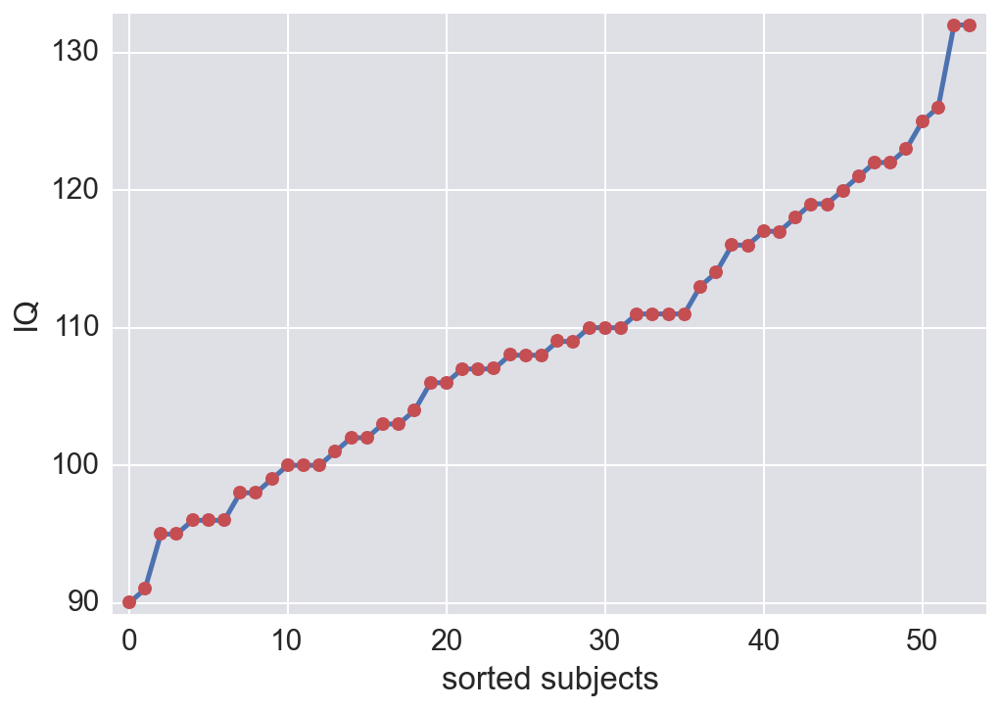

In [19]:
# Compute predicted scores
pred_scores = ridge.predict(data)

# Display results
plt.plot(scores, '-', label='measured')
plt.plot(pred_scores, 'o', color=sns.color_palette()[2], label='predicted')
plt.xlabel('sorted subjects')
plt.ylabel('IQ')
plt.margins(0.02)

It seems to fit exactly!  We might have chosen $\alpha$ to be too small.  Let's look at the coefficients before trying to raise $\alpha$.  We can display the coefficients by plotting them (since it is useless to look at the actual numbers).

|coeffs| < 0.01: 3907


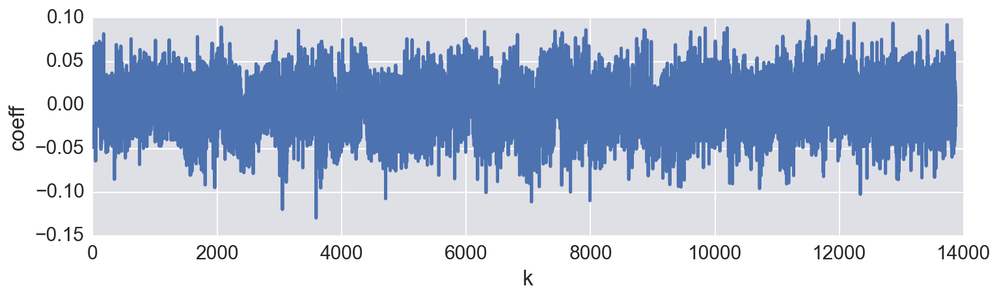

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(12,3))
plt.plot(np.arange(1, len(ridge.coef_)+1), ridge.coef_)
plt.xlabel('k')
plt.ylabel('coeff')

# Print number of coefficients less than 0.01
print('|coeffs| < 0.01:', np.sum(abs(ridge.coef_) < 0.01))

We see that many of the coefficients are not close to zero.  Let's try upping the regularization coefficient and trying again.

|coeffs| < 0.01: 4802


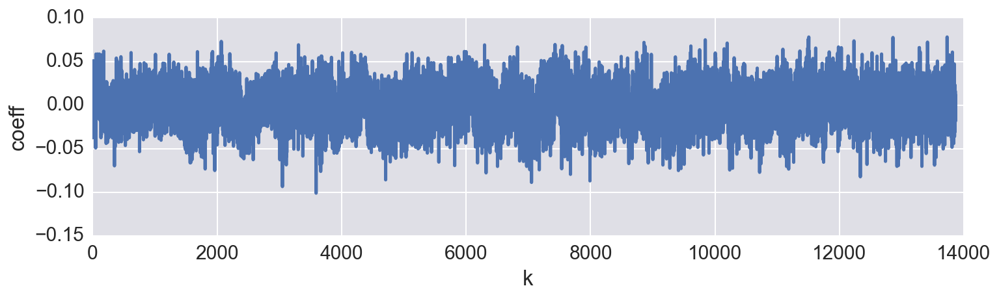

In [25]:
# Instantiate ridge object (need to fit intercept, which is a_0)
ridge = sklearn.linear_model.Ridge(fit_intercept=True, alpha=100)

# Perform the fit
ridge.fit(data, scores)

fig, ax = plt.subplots(1, 1, figsize=(12,3))
plt.plot(np.arange(1, len(ridge.coef_)+1), ridge.coef_)
plt.xlabel('k')
plt.ylabel('coeff')

# Print number of coefficients less than 0.01
print('|coeffs| < 0.01:', np.sum(abs(ridge.coef_) < 0.01))

So, by increasing the regularization parameter, we got more small coefficients, but it is still very difficult to tell which parameters are really contributing to the IQ score.  We can try plotting the predicted vs. measured data again to see if we're getting a good fit.

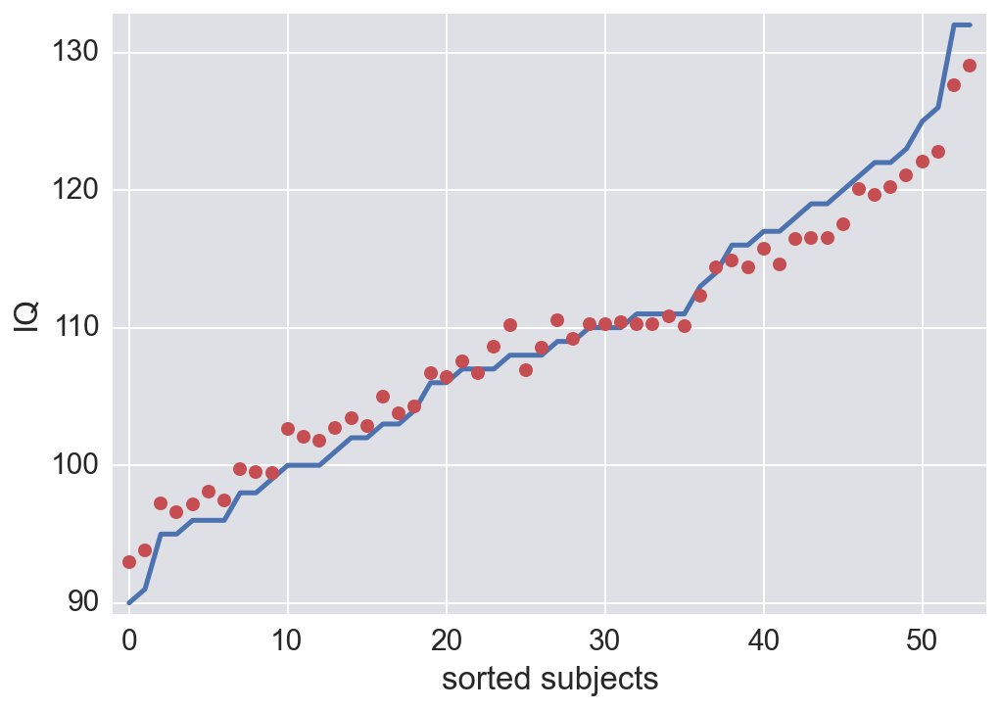

In [26]:
# Compute predicted scores
pred_scores = ridge.predict(data)

# Display results
plt.plot(scores, '-', label='measured')
plt.plot(pred_scores, 'o', color=sns.color_palette()[2], label='predicted')
plt.xlabel('sorted subjects')
plt.ylabel('IQ')
plt.margins(0.02)

We see that we have smoothed out the curve, and we've sacrificed a bit of fidelity for fewer large coefficients.  However, we still are not doing very well, because we have so many coefficients that are still so large.

## LASSO regression
As an alternative regularization strategy to ridge regression, we will try LASSO (Least Absolute Shrinkage and SelectiOn) regression.  In this case, our prior for the parameters is

\begin{align}
P(\mathbf{a}\mid I) \propto \mathrm{exp}\left[-\frac{\alpha}{2\sigma^2}\sum_k \left|a_k\right|\right].
\end{align}

The MAP-finding problem is then

\begin{align}
\arg \min_\mathbf{a} \left( \sum_s \left( \text{IQ}_s - a_0 - \sum_k a_k \rho_{sk} \right)^2 + \alpha\sum_k \left|a_k\right|\right).
\end{align}

The means that we limit the parameters by penalizing the log posterior with the $L_1$ norm of the parameters, as opposed to the $L_2$ norm used in ridge.  While the MAP-finding problem for a LASSO regression is still convex (and therefore has a guaranteed solution), there is not closed-form solution, and numerical methods must be used.  This is not a big issue, really, and we will use `scikit-learn` to perform a LASSO regression similarly as we did for ridge.

The big advantage of LASSO regression is that, for reasons that can be derived but I won't go into here, parameters that are unimportant are driven identically to zero.  So, we can very clearly identify key parameters in the model.

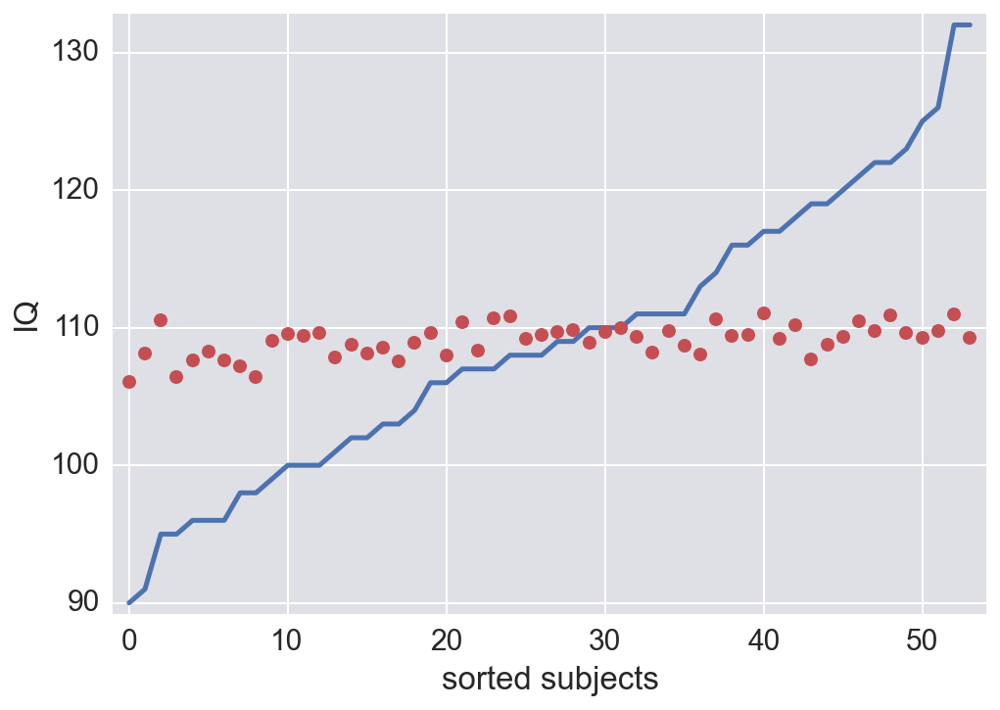

In [27]:
# Instantiate Lasso object (need to fit intercept, which is a_0)
lasso = sklearn.linear_model.Lasso(fit_intercept=True, alpha=1)

# Perform the fit
lasso.fit(data, scores)

# Compute predicted scores
pred_scores = lasso.predict(data)

# Display results
plt.plot(scores, '-', label='measured')
plt.plot(pred_scores, 'o', color=sns.color_palette()[2], label='predicted')
plt.xlabel('sorted subjects')
plt.ylabel('IQ')
plt.margins(0.02)

Whoa!  We way over-smoothed the data with $\alpha = 1$!  We should decrease $\alpha$ so as not to regularize so strongly.  (Note, by the way, that `scikit-learn` scales $\alpha$ by a factor of $2n$, as compared to our statement of the optimization problem.)

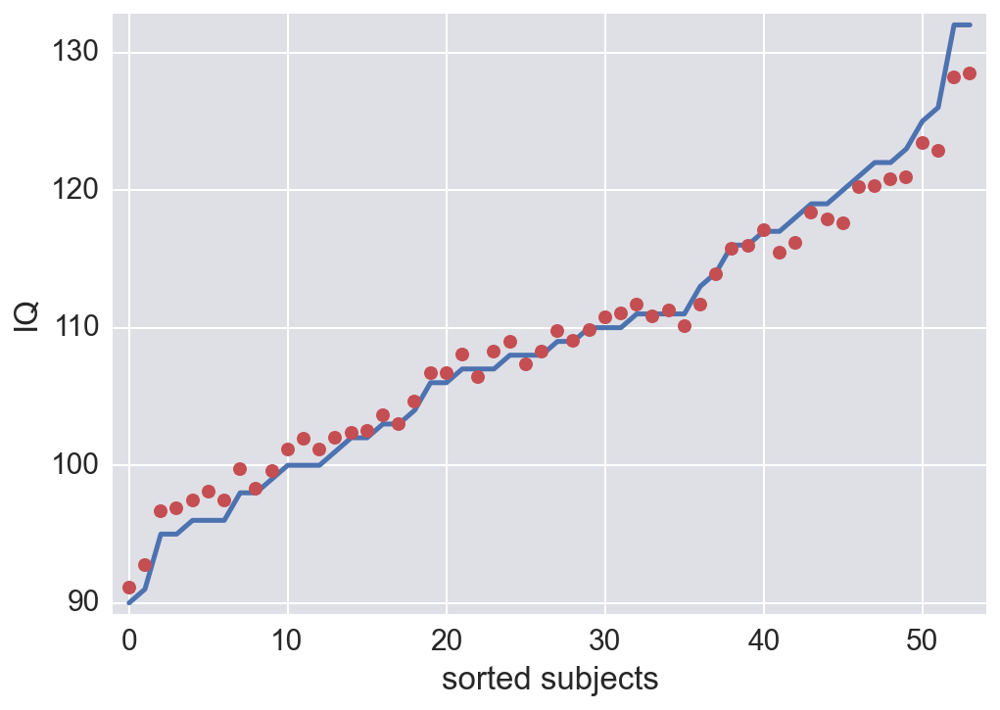

In [28]:
# Instantiate ridge object (need to fit intercept, which is a_0)
lasso = sklearn.linear_model.Lasso(fit_intercept=True, alpha=0.1)

# Perform the fit
lasso.fit(data, scores)

# Compute predicted scores
pred_scores = lasso.predict(data)

# Display results
plt.plot(scores, '-', label='measured')
plt.plot(pred_scores, 'o', color=sns.color_palette()[2], label='predicted')
plt.xlabel('sorted subjects')
plt.ylabel('IQ')
plt.margins(0.02)

Now we're doing better at matching the data, but let's see how many parameters we have that are non-zero.

# of nonzero coeffs: 47


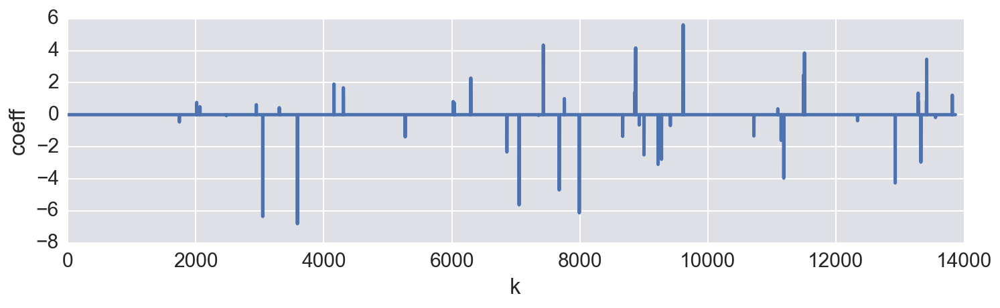

In [29]:
fig, ax = plt.subplots(1, 1, figsize=(12,3))
plt.plot(np.arange(1, len(lasso.coef_)+1), lasso.coef_)
plt.xlabel('k')
plt.ylabel('coeff')

# Print number of coefficients less than 0.01
print('# of nonzero coeffs:', np.sum(~np.isclose(lasso.coef_, 0)))

We see that parameters are driven to zero, and only 47 remain.  Perhaps the largest of these provide the most explanations of IQ.  But how do we know?

## Cross-validation
When working with data sets such as these, when we have many more parameters than measurements, we need to validate that our regressions actually provide explanatory power.  There are many ways to do cross-validation.  We will do a simple, and oft-used test.  We will split the data set into two pieces, a **training set** and a **test set**.  We perform a LASSO regression on the training set, and then use the results from the training set to predict what we expect in the test set.  If the prediction is good, we have some confidence that the model we have fit provides some insights as to what is causing the effect (in our case, IQ).  Conveniently, `scikit-learn` provides a function to randomly split the data into a training and test set.  Note that several other methods of cross-validation, such as leave-one-out that Julien often uses, [available in `scikit-learn`](http://scikit-learn.org/stable/modules/classes.html#module-sklearn.cross_validation).

In [30]:
# Split data into training and and test sets
data_train, data_test, scores_train, scores_test = \
    sklearn.cross_validation.train_test_split(data, scores, test_size=0.4,
                                              random_state=42)

Now that the data have been split, we'll compute the LASSO on the training set and then try to predict the test set.

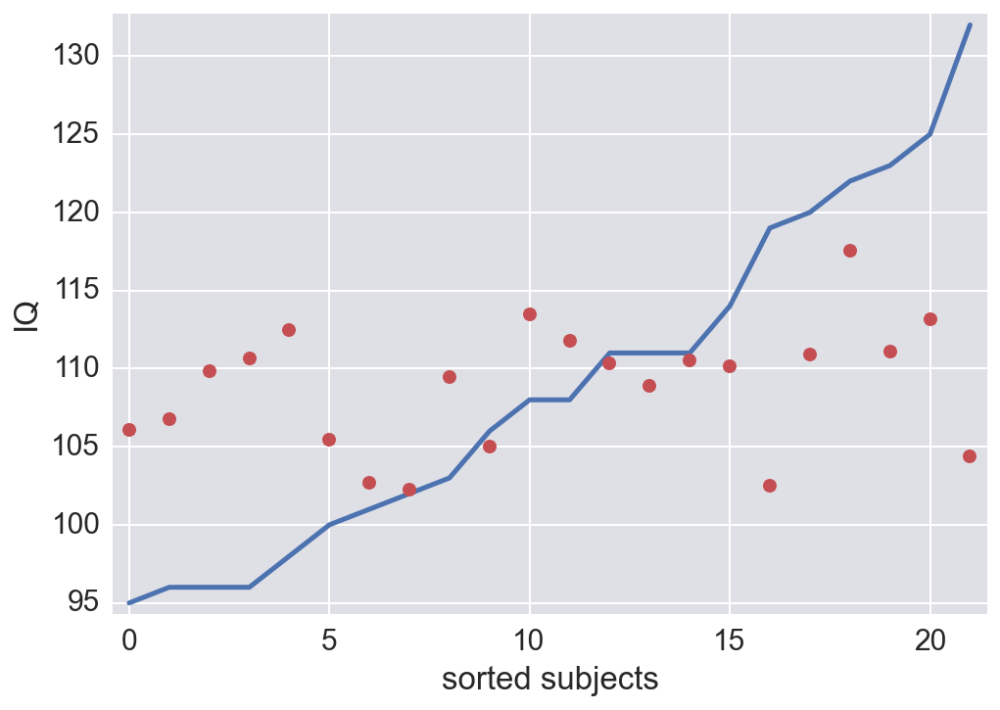

In [31]:
# Instantiate ridge object (need to fit intercept, which is a_0)
lasso = sklearn.linear_model.Lasso(fit_intercept=True, alpha=0.1)

# Perform the fit
lasso.fit(data_train, scores_train)

# Compute predicted scores
pred_scores = lasso.predict(data_test)

# Sort by real scores for ease of plotting
df_res = pd.DataFrame({'scores': scores_test.values, 'predicted': pred_scores},
                         index=scores_test.index)
df_res = df_res.sort_values(by='scores')

# Display results
plt.plot(df_res['scores'], '-', label='measured')
plt.plot(df_res['predicted'], 'o', color=sns.color_palette()[2], label='predicted')
plt.xlabel('sorted subjects')
plt.ylabel('IQ')
plt.margins(0.02)

Clearly, the regression really taught us nothing, as it failed pretty spectacularly to predict IQs of the test subjects.

## Regularization parameter selection by cross-validation
Perhaps we just didn't choose the right regularization parameter.  How might we choose the "best" one?  It should be the one that reduces a cross-validation error.  That is, we should try to fit a training set with a given $\alpha$, and then test how well its predictions match the test set.  We do this for many values of $\alpha$, and pick the $\alpha$ that minimizes the cross-validation error.  There are many ways to define a cross-validation error.  A common one is to use the mean squared error.  Many random training/test splits are generated, and then we compute

\begin{align}
\text{error}(\alpha) = \frac{1}{k}\sum_k\frac{1}{n_k}\sum_{i=1}^{n_k}
\left(IQ_\text{i,meas} - IQ_\text{i,pred}\right)^2,
\end{align}

`scikit-learn` does this automatically with `sklearn.linear_model.LassoCV`.

In [32]:
# Instantiate cross-validation instance using 20 cross-validation samples
lasso_cv = sklearn.linear_model.LassoCV(fit_intercept=True, max_iter=10000, 
                                        cv=20, n_jobs=6)

# Perform the fit
lasso_cv.fit(data, scores)

LassoCV(alphas=None, copy_X=True, cv=20, eps=0.001, fit_intercept=True,
    max_iter=10000, n_alphas=100, n_jobs=6, normalize=False,
    positive=False, precompute='auto', random_state=None,
    selection='cyclic', tol=0.0001, verbose=False)

To access the results, as can plot the values of $\alpha$ it generated versus the mean squared error.  It is traditional to plot $-\log_{10} \alpha$ on the $x$-axis, which also allows better visualization of the curves.

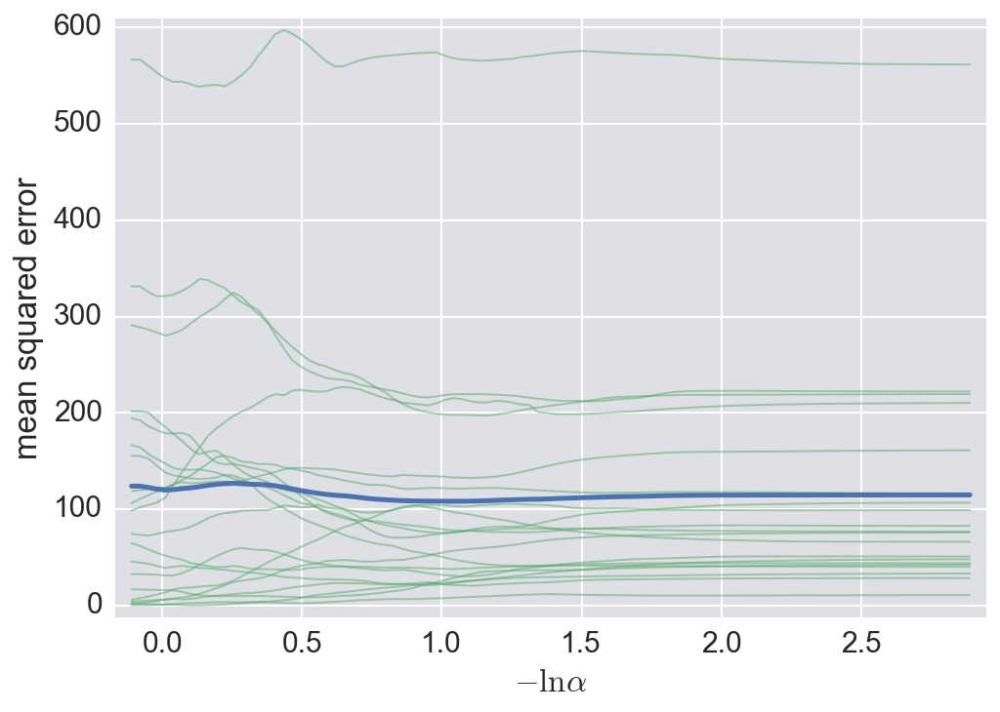

In [33]:
# Compute x-values
minus_log_alphas = -np.log10(lasso_cv.alphas_)

# Plot result for each cross-validation trial
plt.plot(minus_log_alphas, lasso_cv.mse_path_, color=sns.color_palette()[1], 
         alpha=0.5, lw=1)

# Plot mean of the results
plt.plot(minus_log_alphas, lasso_cv.mse_path_.mean(axis=1), '-')
plt.xlabel(r'$-\ln \alpha$')
plt.ylabel(r'mean squared error')
plt.margins(0.02)

This calculation yielded a best alpha of:

In [34]:
print('Best alpha:', lasso_cv.alpha_)

Best alpha: 0.0848269542386


We can now look at how well we do with predictions.

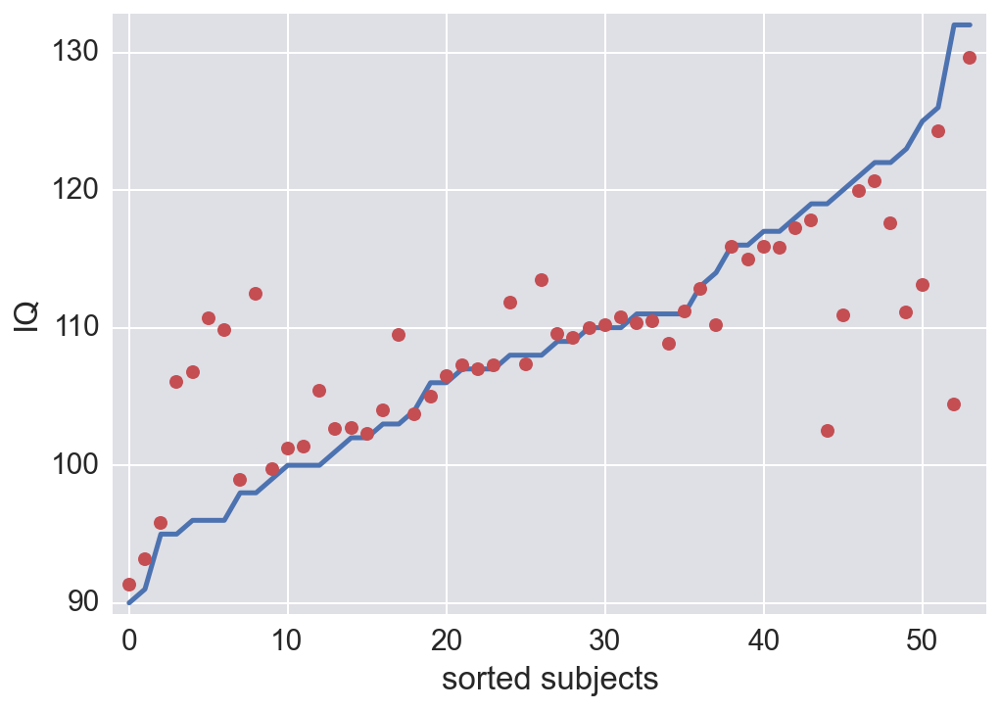

In [35]:
# Compute predicted scores
pred_scores = lasso.predict(data)

# Display results
plt.plot(scores, '-', label='measured')
plt.plot(pred_scores, 'o', color=sns.color_palette()[2], label='predicted')
plt.xlabel('sorted subjects')
plt.ylabel('IQ')
plt.margins(0.02)

We should view this plot with caution, since the the algorithm used by `LassoCV` used a test set to do the fit with the best $\alpha$, which is what is being shown here.  It is quite likely that the data that are "off" are in fact a test set.  To make sure the LASSO regression is reasonable, we should do another train/test pairing using our best $\alpha$.

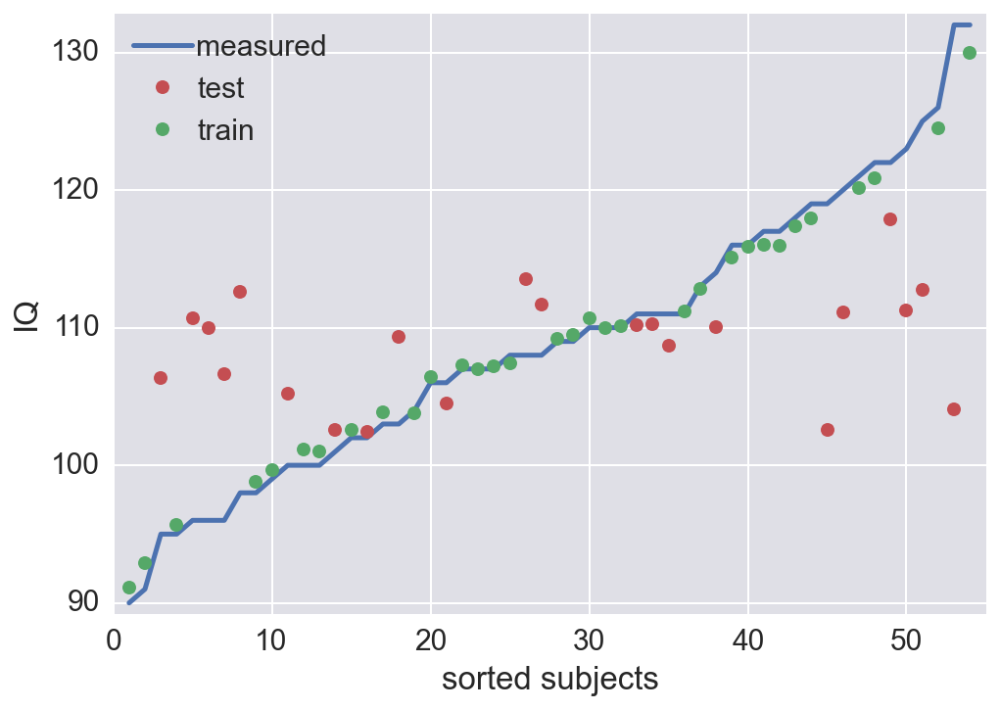

In [52]:
# Instantiate ridge object (need to fit intercept, which is a_0)
lasso = sklearn.linear_model.Lasso(fit_intercept=True, alpha=lasso_cv.alpha_)

# Perform the fit
lasso.fit(data_train, scores_train)

# Compute predicted scores
pred_scores_test = lasso.predict(data_test)
pred_scores_train = lasso.predict(data_train)

# Sort by real scores for ease of plotting
df_test = pd.DataFrame({'scores': scores_test.values, 
                        'predicted': pred_scores_test,
                        'test': np.ones_like(pred_scores_test, dtype=bool)}) 
df_train = pd.DataFrame({'scores': scores_train.values, 
                         'predicted': pred_scores_train,
                         'test': np.zeros_like(pred_scores_train, dtype=bool)})
df_res = df_test.append(df_train, ignore_index=True)
df_res = df_res.sort_values(by='scores')
df_res['x_plot'] = np.arange(1, len(df_res)+1)

# Display results
plt.plot(df_res['x_plot'], df_res['scores'], '-', label='measured')
inds = df_res['test']
plt.plot(df_res[inds]['x_plot'], df_res['predicted'][inds], 'o', 
         color=sns.color_palette()[2], label='test')

inds = ~df_res['test']
plt.plot(df_res[inds]['x_plot'], df_res['predicted'][inds], 'o', 
         color=sns.color_palette()[1], label='train')
plt.xlabel('sorted subjects')
plt.ylabel('IQ')
plt.legend(loc='upper left')
plt.margins(0.02)

So, we really didn't do very well with predictions.  I would not conclude that we are able to predict IQ from the correlations of regions of the brain as we have, at least not using linear regression techniques.

### Investigating the results with Bokeh
While we can't really conclude that we have done well with our predictions, I thought I would demonstrate how Bokeh can be used to efficiently look at our LASSO regression results.  First, we'll plot the actual and predicted IQs.

In [54]:
# Put everything in the same DataFrame
pred_scores = lasso.predict(data)
df_sub = data.copy()
df_sub['scores'] = scores
df_sub['predicted'] = pred_scores
df_sub['sorted_subject'] = np.arange(1, len(scores)+1)

# Specify data source
source = bokeh.models.ColumnDataSource(df_sub)

# What pops up on hover?
tooltips = [('subject', '@subject')]

# Make the hover tool
hover = bokeh.models.HoverTool(tooltips=tooltips)

# Create figure
p = bokeh.plotting.figure(background_fill='#DFDFE5', plot_width=650, 
                          plot_height=450)
p.xgrid.grid_line_color = 'white'
p.ygrid.grid_line_color = 'white'
p.yaxis.axis_label = 'IQ'
p.xaxis.axis_label = 'sorted subject'

# Add the hover tool
p.add_tools(hover)

# Populate glyphs
p.line(x='sorted_subject', y='scores', source=source, color='dodgerblue',
       line_width=3)
p.circle(x='sorted_subject', y='predicted', size=7, source=source, color='tomato')

bokeh.io.show(p)

And we can also build a hover tool for the parameters.

In [55]:
# Make a DataFrame with k, i, j, and labels
df_coef = df[df['subject'] == 1][['i', 'j', 'k']].copy()
df_coef['region_1'] = [df_key['region'][i] for i in df_coef['i']]
df_coef['region_2'] = [df_key['region'][j] for j in df_coef['j']]
df_coef['coef'] = lasso_cv.coef_

# Make DataFrame with nonzero entries
df_nz = df_coef[~np.isclose(df_coef['coef'], 0)]

# Specify data source
source = bokeh.models.ColumnDataSource(df_coef)
source_nz = bokeh.models.ColumnDataSource(df_nz)

# What pops up on hover?
tooltips = [('k', '@k'), ('region_1', '@region_1'), ('region_2', '@region_2')]

# Make the hover tool
hover = bokeh.models.HoverTool(tooltips=tooltips)

# Create figure
p = bokeh.plotting.figure(background_fill='#DFDFE5', plot_width=650, 
                          plot_height=250)
p.xgrid.grid_line_color = 'white'
p.ygrid.grid_line_color = 'white'
p.yaxis.axis_label = 'coeff'
p.xaxis.axis_label = 'k'

# Add the hover tool
p.add_tools(hover)

# Populate glyphs
p.line(x='k', y='coef', source=source, color='dodgerblue', line_width=2)
p.circle(x='k', y='coef', source=source_nz, color='dodgerblue', size=4)

bokeh.io.show(p)